In [1]:
import os
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn import preprocessing
from sklearn import metrics

import scipy.stats as stats
import scipy.signal
from scipy.stats import spearmanr, pearsonr

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
%matplotlib inline
sns.set(style='white', context='notebook', rc={'figure.figsize':(14,10)})

import random
import math
import collections
from collections import Counter
from collections import OrderedDict
from itertools import product
from copy import deepcopy
from tqdm import tqdm, trange

import anndata as ad
import scanpy as sc
import tempfile
import subprocess
import shlex
import logging
import logomaker
import pickle

import torch
import torch.nn as nn
import torch.nn.functional as F

seed = 1337
random.seed(seed)
np.random.seed(seed)
# import Muscle

In [2]:
# import argparse
# from argparse import Namespace
# from collections import Counter
# parser = argparse.ArgumentParser()

# parser.add_argument('--filename', type = str, default = './ESM2_finetuned/representations/Finetuned_4.1_train__CVESM2lr1e-5_ESM2SISS_FS4.1.ep93.1e-2.dr2_unmod_1_10folds_rl_LabelScalerFalse_LabelLog2False_AvgEmbFalse__representations_bos.npz')
# parser.add_argument('--ngrams', type = int, default = 8)
# parser.add_argument('--ratio', action = 'store_true')
# args = parser.parse_args([])
# print(args)

# global obj_col, seed
# out_filename = f'SHAP_{args.ngrams}grams__' + '__'.join(args.filename.split('__')[1:3])
# print(out_filename)

In [2]:
def r2(x,y):
    slope, intercept, r_value, p_value, std_err = stats.linregress(x,y)
    return r_value**2

def performances(label, pred):
    
    r = r2(label, pred)
    pearson_r = pearsonr(label, pred)[0]
    sp_cor = spearmanr(label, pred)[0]
    print(f'r-squared = {r:.4f} | pearson r = {pearson_r:.4f} | spearman R = {sp_cor:.4f}')
            
    return [r, pearson_r, sp_cor]

In [5]:
obj_col = 'representations_bos_lastLayer_ESM2'
train_data = np.load('/home/ubuntu/esm2/Sample/Embedding_Contacts/ESM2_finetuned/representations_bos/Finetuned_4.1_train__CVESM2lr1e-5_ESM2SISS_FS4.1.ep93.1e-2.dr2_unmod_1_10folds_rl_LabelScalerFalse_LabelLog2False_AvgEmbFalse__representations_bos.npz')
test_data = np.load('/home/ubuntu/esm2/Sample/Embedding_Contacts/ESM2_finetuned/representations_bos/Finetuned_4.1_test__CVESM2lr1e-5_ESM2SISS_FS4.1.ep93.1e-2.dr2_unmod_1_10folds_rl_LabelScalerFalse_LabelLog2False_AvgEmbFalse__representations_bos.npz')
print(list(train_data.keys()))

train_repr = train_data[obj_col]
test_repr = test_data[obj_col]
data_repr = np.vstack([train_repr, test_repr])

train_seq = train_data['sequences']
test_seq = test_data['sequences']
seqs = list(train_seq) + list(test_seq)

print(train_repr.shape, test_repr.shape, data_repr.shape, len(seqs))

['sequences', 'labels', 'representations_bos_firstLayer_ESM2', 'representations_bos_lastLayer_ESM2']
(260000, 128) (20000, 128) (280000, 128) 280000


In [6]:
train_df = pd.DataFrame([train_data['sequences'], train_data['labels']], index = ['sequences', 'labels']).T
train_df['class'] = [f'{math.ceil(i)-1}~{math.ceil(i)}' for i in train_df.labels]
train_df

,sequences,labels,class
0,CCGGCTATAGCGCGCAGTGCTCGGATGGCAAGGCGTTCAACCGTGA...,5.049107,5~6
1,AATGGGTACCGTATGTCAAAGGAACCATAGGCGCGGTCGTAGTGGA...,3.944024,3~4
2,CCGCGGCATGATCAAACGGTCTAGATCATAATGCGAGGTCAGTACC...,4.665749,4~5
3,GTGTAAGGCTCTGGTGGGCACACGTCGGTTTGCAGTAATGACAGAC...,3.78784,3~4
4,CCGGAAAATCGCGCAAGTCTCCCTTACGAATAAAGCTCAAAGGGAA...,8.059969,8~9
...,...,...,...
259995,TCGCTTTGAGGCGCACGTGAAACGCAGCAACCCCCTCGAAGTTGTC...,7.575412,7~8
259996,CGCTAGAACCAGGAGCAACGTAGCGTAAGGGGAATATGAAGGAAAA...,8.040876,8~9
259997,GGTGAACGACGAGACAATAACGTGGGCCTTTAAAGGAATAGGGCAA...,8.390005,8~9
259998,CCGGAGTATTACATCACACATGAGCCCGGTGGGGATGTTGGGGAGC...,2.92572,2~3


In [7]:
test_df = pd.DataFrame([test_data['sequences'], test_data['labels']], index = ['sequences', 'labels']).T
test_df['class'] = [f'{math.ceil(i)-1}~{math.ceil(i)}' for i in test_df.labels]
test_df

,sequences,labels,class
0,CCACTCGATTAACATGTTAACAACATACTCGTCCGGCCGATCAGCG...,3.039939,3~4
1,CAAATCATGTGCAGCCCTGGCGACCGTACTGCGGTACAAGAAAGTA...,3.895109,3~4
2,GTTATACTAGAAGAAACTTGAGATTATGGAGCAGTCCGTCAAGGAC...,3.334524,3~4
3,CTTAGACAAAAACAACGCGCTTTCCAGTATGCGGAGCCTTGACGGT...,3.575082,3~4
4,GTATCAAATCACGGCCAACCCGACGGAGTACCCCGCGTCGATGGTC...,4.593712,4~5
...,...,...,...
19995,ACATATAAGAATCTGACCAAGCAACGAAAGATACCGGCTCGTTGCT...,7.691486,7~8
19996,ACAAGTTACAAGGAGATCTCAAACGCAGGAGGTCACAAGGAAGAGC...,7.784341,7~8
19997,TAGGGTCTGCGACCGGGCATCACGACGAAACCCATGAAGAGTTTTC...,5.264264,5~6
19998,CGGCACAATGCATGCCAACTGGAGGCCTGTGCTGACGTGAAGAGTT...,3.698645,3~4


In [8]:
data_df = pd.concat([train_df, test_df], axis = 0)
data_df

,sequences,labels,class
0,CCGGCTATAGCGCGCAGTGCTCGGATGGCAAGGCGTTCAACCGTGA...,5.049107,5~6
1,AATGGGTACCGTATGTCAAAGGAACCATAGGCGCGGTCGTAGTGGA...,3.944024,3~4
2,CCGCGGCATGATCAAACGGTCTAGATCATAATGCGAGGTCAGTACC...,4.665749,4~5
3,GTGTAAGGCTCTGGTGGGCACACGTCGGTTTGCAGTAATGACAGAC...,3.78784,3~4
4,CCGGAAAATCGCGCAAGTCTCCCTTACGAATAAAGCTCAAAGGGAA...,8.059969,8~9
...,...,...,...
19995,ACATATAAGAATCTGACCAAGCAACGAAAGATACCGGCTCGTTGCT...,7.691486,7~8
19996,ACAAGTTACAAGGAGATCTCAAACGCAGGAGGTCACAAGGAAGAGC...,7.784341,7~8
19997,TAGGGTCTGCGACCGGGCATCACGACGAAACCCATGAAGAGTTTTC...,5.264264,5~6
19998,CGGCACAATGCATGCCAACTGGAGGCCTGTGCTGACGTGAAGAGTT...,3.698645,3~4


In [131]:
def plot_anndata_leiden(
    a,
    color,
    representation = "umap",
    representation_axes_label = "",
    swap_axes = False,
    cmap = plt.get_cmap("viridis"),
    direct_label = True,
    adjust = False,
    ax_tick = False,
    legend_size = None,
    figsize = (6.4, 4.8),
    fname = "",
    **kwargs,
):

    """
    Plot the given adata's representation, directly labelling instead of using
    a legend
    """
    rep_key = "X_" + representation
#     print(rep_key)
    assert (
        rep_key in a.obsm
    ), f"Representation {representation} not fount in keys {a.obsm.keys()}"

    coords = a.obsm[rep_key]
    if swap_axes:
        coords = coords[:, ::-1]  # Reverse the columns
    assert isinstance(coords, np.ndarray) and len(coords.shape) == 2
    assert coords.shape[0] == a.n_obs
    assert color in a.obs
    color_vals = a.obs[color]
    unique_val = np.unique(color_vals.values)
    color_idx = [list(unique_val).index(i) for i in color_vals]
    # Vector of colors for each point
    color_vec = [cmap(i) for i in color_idx]

    fig, ax = plt.subplots(figsize=figsize, dpi=300)
    ax.scatter(
        coords[:, 0], coords[:, 1], s=0.5, c=color_vec, alpha=0.5
    )
    if direct_label:
        # Label each cluster
        texts = []
        for v in unique_val:
            v_idx = np.where(color_vals.values == v)
            # Median behaves better with outliers than mean
            v_coords = np.median(coords[v_idx], axis=0)
            t = ax.text(
                *v_coords,
                v,
                horizontalalignment="center",
                verticalalignment="center",
                size=legend_size,
            )
            texts.append(t)
        if adjust:
            adjust_text(
                texts,
                only_move={"texts": "y"},
                force_text=0.01,
                autoalign="y",
                avoid_points=False,
            )
    else:
        patches = []
        for i, val in enumerate(unique_val):
            p = mpatches.Patch(color=cmap(i), label=f'{val}:n={species_num_dict[val]}')
            patches.append(p)
        ax.legend(handles=patches, prop={"size": legend_size})

    rep_str = representation_axes_label if representation_axes_label else representation
    if not swap_axes:
        ax.set(
            xlabel=f"{rep_str.upper()}1", ylabel=f"{rep_str.upper()}2",
        )
    else:
        ax.set(
            xlabel=f"{rep_str.upper()}2", ylabel=f"{rep_str.upper()}1",
        )
    ax.set(**kwargs)
    if not ax_tick:
        ax.set(xticks=[], yticks=[])

#     if fname:
#         fig.savefig(fname, bbox_inches="tight")
    return fig


In [132]:
def ceil_floor(minimum = -188, maximum = 0, step = 50):
    result = [x for x in range(int(minimum//step*step), int((maximum+step-1)//step*step+1), step)]
    result[0] = math.floor(minimum)
    return result

def plot_anndata_label(
    a,
    color,
    representation = "umap",
    representation_axes_label = "",
    swap_axes = False,
    cmap = 'gnuplot2',
    direct_label = False,
    figsize = (6.4, 4.8),
    fname = "",
    **kwargs,
):
    """
    Plot the given adata's representation, directly labelling instead of using
    a legend
    """
    rep_key = "X_" + representation

    assert (
        rep_key in a.obsm
    ), f"Representation {representation} not fount in keys {a.obsm.keys()}"

    coords = a.obsm[rep_key]
    if swap_axes:
        coords = coords[:, ::-1]  # Reverse the columns
    assert isinstance(coords, np.ndarray) and len(coords.shape) == 2
    assert coords.shape[0] == a.n_obs
    
    fig, ax = plt.subplots(figsize=figsize, dpi=300)
    scatter = ax.scatter(
        coords[:, 0], coords[:, 1], s=2, c=color, alpha=0.5
    )
    colorbar = fig.colorbar(scatter, ax=ax)
    colorbar.set_ticks(ceil_floor(minimum = min(color), maximum = max(color), step = 1))


    rep_str = representation_axes_label if representation_axes_label else representation

    ax.set(
        xlabel=f"{rep_str.upper()}1", ylabel=f"{rep_str.upper()}2", 
    )
    ax.set(**kwargs)
    ax.set(xticks=[], yticks=[])

#     if fname:
#         fig.savefig(fname, bbox_inches="tight")
    return fig


In [182]:
def plot_anndata_rep(
    a,
    label_color,
    leiden_color,
    representation_axes_label = "umap",
    cmap_label = 'gnuplot2',
    cmap_leiden = plt.get_cmap("tab20"),
    figsize = (6.4, 4.8),
    legend_size = 7,
    fname = "",
    title = '',
    **kwargs,
):
    """
    Plot the given adata's representation, directly labelling instead of using
    a legend
    """
    rep_key = "X_" + representation_axes_label

    assert (
        rep_key in a.obsm
    ), f"Representation {representation_axes_label} not fount in keys {a.obsm.keys()}"

    coords = a.obsm[rep_key]
    assert isinstance(coords, np.ndarray) and len(coords.shape) == 2
    assert coords.shape[0] == a.n_obs
    
    fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize=figsize, dpi=300)
    # label MRL
    scatter = ax[0].scatter(
        coords[:, 0], coords[:, 1], s=0.5, c=label_color, alpha=0.5
    )
    colorbar = fig.colorbar(scatter, ax=ax[0])
    colorbar.ax.tick_params(labelsize=legend_size)
    colorbar.set_ticks(ceil_floor(minimum = min(label_color), maximum = max(label_color), step = 1))
    
    ax[0].set_xlabel(f"{representation_axes_label.upper()}1", fontsize=legend_size)
    ax[0].set_ylabel(f"{representation_axes_label.upper()}2", fontsize=legend_size)
    ax[0].set(xticks=[], yticks=[])
    ax[0].set_title("(a) Mean Ribosome Load", fontsize=legend_size, loc="left")

    # leiden
    color_vals = a.obs[leiden_color]
    unique_val = np.unique(color_vals.values)
    color_idx = [list(unique_val).index(i) for i in color_vals]
    color_vec = [cmap_leiden(i) for i in color_idx] # Vector of colors for each point

    ax[1].scatter(
        coords[:, 0], coords[:, 1], s=0.5, c=color_vec, alpha=0.5
    )
    texts = []
    for v in unique_val:
        v_idx = np.where(color_vals.values == v)
        # Median behaves better with outliers than mean
        v_coords = np.median(coords[v_idx], axis=0)
        t = ax[1].text(
            *v_coords,
            v,
            horizontalalignment="center",
            verticalalignment="center",
            size=legend_size,
        )
        texts.append(t)
                
    ax[1].set_xlabel(f"{representation_axes_label.upper()}1", fontsize=legend_size)
    ax[1].set_ylabel(f"{representation_axes_label.upper()}2", fontsize=legend_size)
    ax[1].set(xticks=[], yticks=[])
    ax[1].set_title("(b) Leiden Cluster", fontsize=legend_size, loc="left")
#     if fname:
#         fig.savefig(fname, bbox_inches="tight")
    plt.suptitle(title, fontsize = legend_size)
    return fig


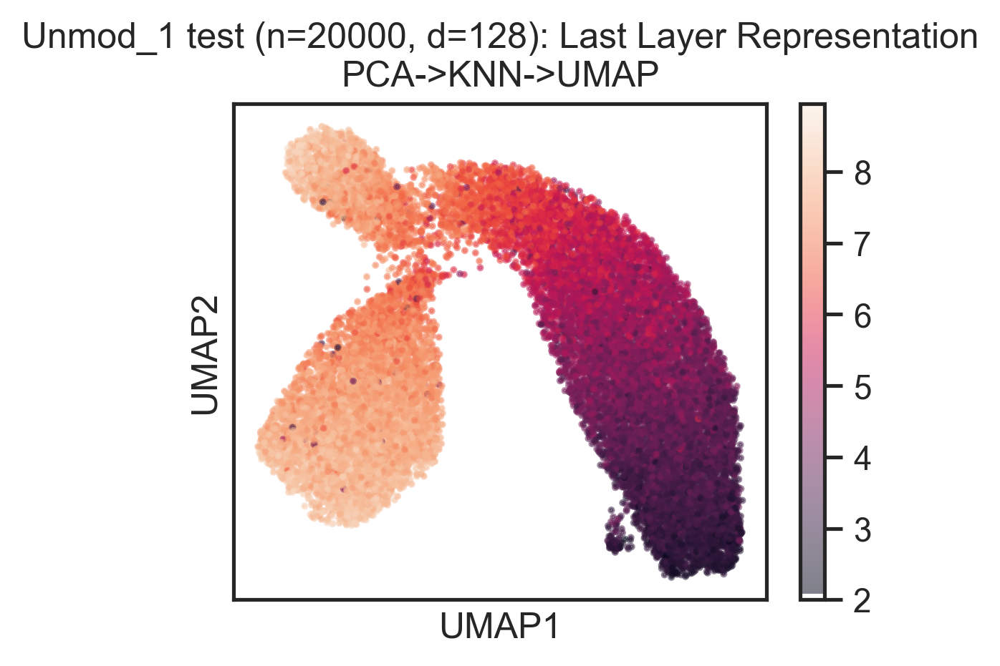

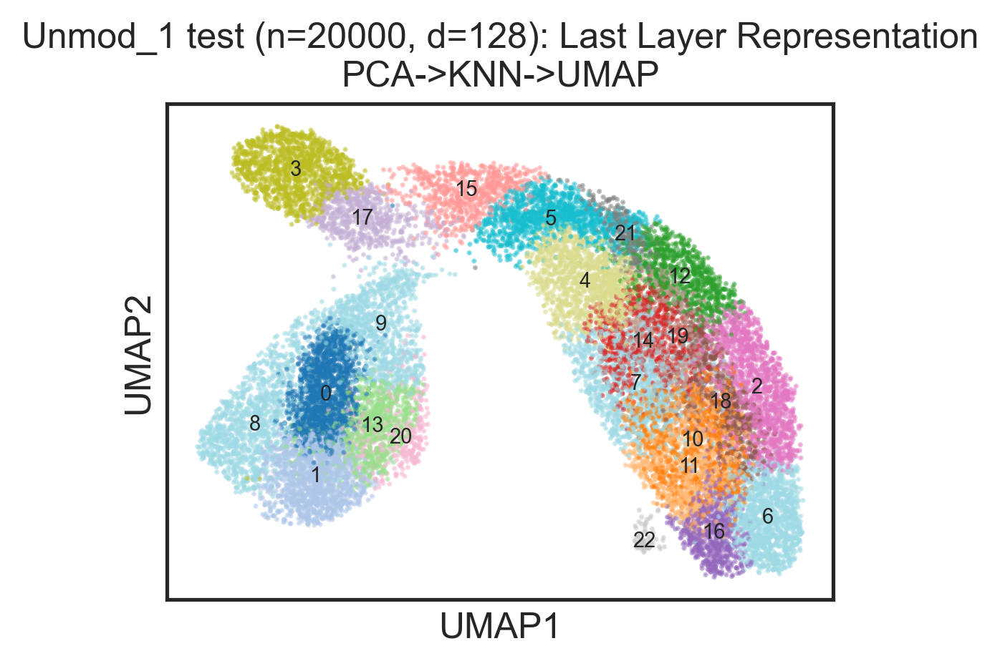

In [135]:
plot_anndata_label(
    test_embedding_adata, color=test_embedding_adata.obs['labels'], cmap='gnuplot2', direct_label = False,
    title="Unmod_1 test (n=20000, d=128): Last Layer Representation\nPCA->KNN->UMAP",
    figsize = (4, 3), 
).show()

plot_anndata_leiden(
    test_embedding_adata, color='leiden', cmap=plt.get_cmap("tab20"), direct_label = True,
    title="Unmod_1 test (n=20000, d=128): Last Layer Representation\nPCA->KNN->UMAP",
    legend_size=7, figsize = (4, 3), fname = ''#f'ESM2_{species}_SpeciesClass.pdf',
).show()

plot_anndata_rep(
    test_embedding_adata, label_color=test_embedding_adata.obs['labels'], leiden_color = 'leiden',
    title="UTR-LM Representation of U1 Test data (n=20000)",
    legend_size=7, figsize = (8, 3), fname = ''#f'ESM2_{species}_SpeciesClass.pdf',
).show()

In [12]:
def read_fasta(fname: str):
    """Read fa file, returning a dict of seq names to seqs"""
    retval = {}
    curr_key, curr_seq = "", ""
    with open(fname) as source:
        for line in source:
            line = line.strip()
            if line.startswith(">"):
                if curr_key:  # Previous record
                    assert curr_seq
                    retval[curr_key] = curr_seq
                curr_key = line.strip(">").strip()
                curr_seq = ""  # Reset
            else:
                curr_seq += line.strip()
    if curr_key:  # Store trailing record
        assert curr_seq
        retval[curr_key] = curr_seq
    return retval


In [13]:
def per_position_aa_count(
    sequences, *, normalize = False, psuedocount = 0,
):
    """
    Return a count matrix of (seq_len, n_amino_acids) reflecting
    counts of each amino acid at each base
    """
    seq_mat = np.stack([np.array(list(x)) for x in sequences])
    num_seq, fixed_len = seq_mat.shape
    assert num_seq == len(sequences)
    per_pos_counts = []
    for j in range(fixed_len):
        col = seq_mat[:, j]
        assert len(col) == num_seq
        counter = collections.Counter(col)
        count_vec = np.array([counter[aa] for aa in 'AGCT'])
        count_vec += psuedocount
        per_pos_counts.append(count_vec)
    per_pos_counts = np.stack(per_pos_counts)
    assert per_pos_counts.shape == (seq_mat.shape[1], len('AGCT'))
    # assert np.allclose(np.sum(per_pos_counts, 1), np.sum(per_pos_counts[0]))
    if normalize:
        row_sums = set(per_pos_counts.sum(axis=1).tolist())
        assert len(row_sums) == 1
        per_pos_counts = per_pos_counts.astype(np.float64)
        per_pos_counts /= row_sums.pop()
        assert np.all(np.isclose(per_pos_counts.sum(axis=1), 1.0))
    retval = pd.DataFrame(per_pos_counts, columns=list('AGCT'))
    return retval


In [14]:
def logo_files(embedding_adata, prefix = ''):
    clusters = [str(i) for i in range(len(collections.Counter(embedding_adata.obs['leiden'])))]
    input_fname, output_fname = [], []
    for cluster in clusters:
        cluster_of_interest = embedding_adata.obs.iloc[
                np.where(embedding_adata.obs['leiden'] == cluster)
            ]
        tempdir = '/home/ubuntu/esm2/Sample/Embedding_Contacts/'

        # Write the MUSCLE input
        logging.debug(f"Running MUSCLE for MSA in {tempdir}")
        muscle_input_fname = os.path.join(tempdir, f"{prefix}_msa_input_{cluster}.fa")
        with open(muscle_input_fname, "w") as sink:
            sink.write("\n".join([f"> {i}\n{seq}" for i, seq in enumerate(cluster_of_interest['sequences'])]))
            sink.write("\n")
        # Call MUSCLE
        #print(tempdir)
        #print(muscle_input_fname)

        muscle_output_fname = os.path.join(tempdir, f"msa_output_{cluster}.fa")
        #print(muscle_output_fname)
        muscle_cmd = f"nohup muscle -in {muscle_input_fname} -out {muscle_output_fname} 2>&1 &"
        print(muscle_cmd)
        input_fname.append(muscle_input_fname)
        output_fname.append(muscle_output_fname)
    return input_fname, output_fname

In [15]:
def logo_graph(files):
    for f in files:
        logo_kwargs = {
            "show_spines": False,
            "alpha": 0.9,
        }
        msa_seqs = list(read_fasta(f).values()) # if msa: outputfile; elif no msa:inputfile
        msa_pwm = per_position_aa_count(msa_seqs, normalize=False)
        fig, ax = plt.subplots(figsize=(10, 1))
        logo = logomaker.Logo(msa_pwm, ax=ax, **logo_kwargs) # 
        ax.set(title = f'Leiden Cluster {f.split("_")[-1][:-3]}')

# Run

/tmp/ipykernel_92376/2155669860.py:1: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  test_embedding_adata = ad.AnnData(test_repr, obs = test_df)
/home/ubuntu/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
2023-05-18 03:38:39.512954: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-18 03:38:42.789881: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


AnnData object with n_obs × n_vars = 20000 × 128
    obs: 'sequences', 'labels', 'class'
    uns: 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'
nohup muscle -in /home/ubuntu/esm2/Sample/Embedding_Contacts/test_msa_input_0.fa -out /home/ubuntu/esm2/Sample/Embedding_Contacts/msa_output_0.fa 2>&1 &
nohup muscle -in /home/ubuntu/esm2/Sample/Embedding_Contacts/test_msa_input_1.fa -out /home/ubuntu/esm2/Sample/Embedding_Contacts/msa_output_1.fa 2>&1 &
nohup muscle -in /home/ubuntu/esm2/Sample/Embedding_Contacts/test_msa_input_2.fa -out /home/ubuntu/esm2/Sample/Embedding_Contacts/msa_output_2.fa 2>&1 &
nohup muscle -in /home/ubuntu/esm2/Sample/Embedding_Contacts/test_msa_input_3.fa -out /home/ubuntu/esm2/Sample/Embedding_Contacts/msa_output_3.fa 2>&1 &
nohup muscle -in /home/ubuntu/esm2/Sample/Embedding_Contacts/test_msa_input_4.fa -out /home/ubuntu/esm2/Sample/Embedding_Contacts/msa_output_4.fa 2>&1 &
nohup muscle -in /home/ubu

/tmp/ipykernel_92376/764380036.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 1))


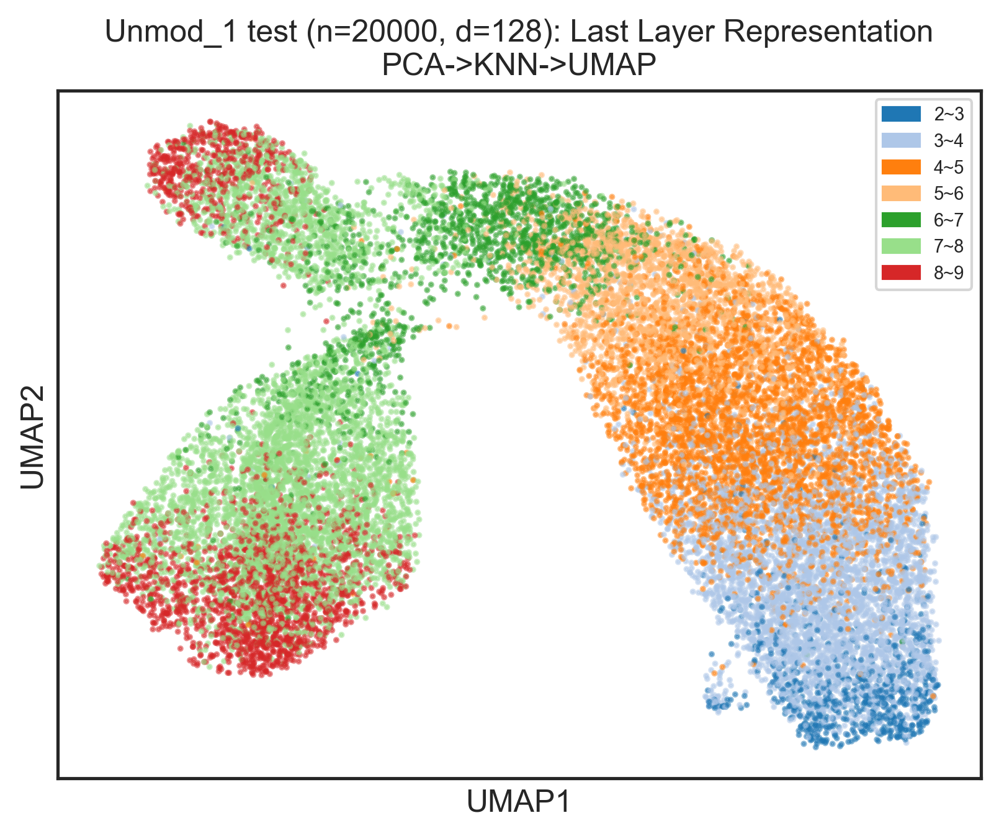

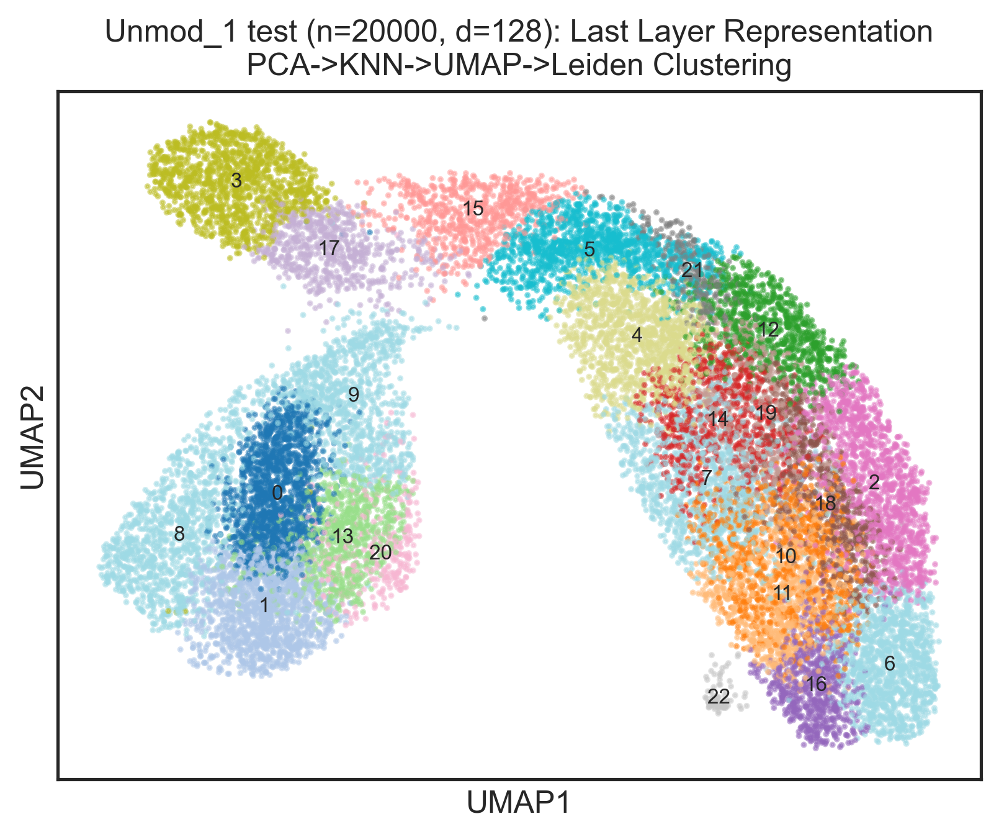

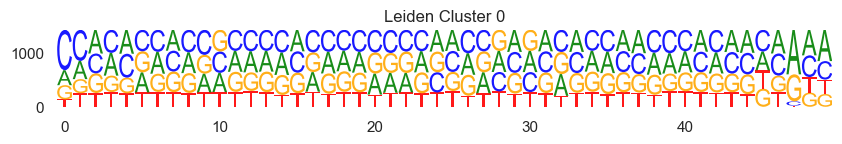

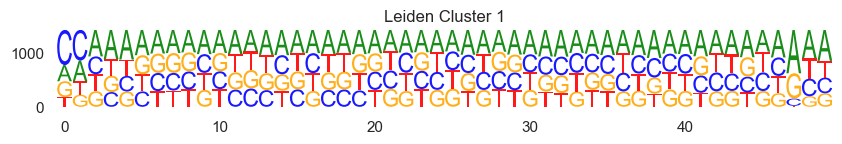

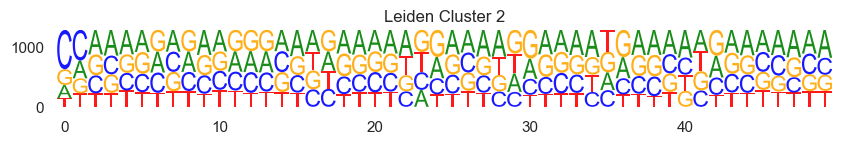

...

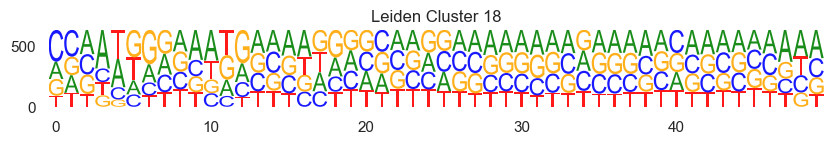

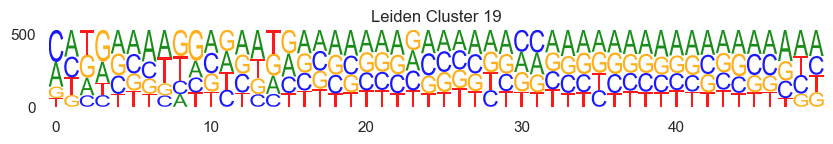

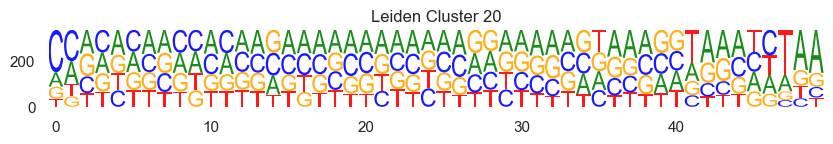

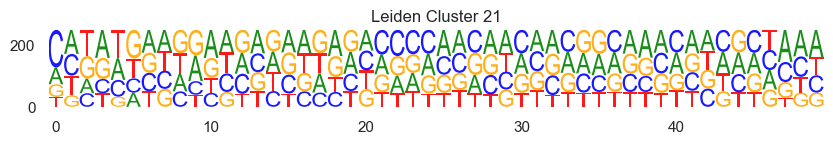

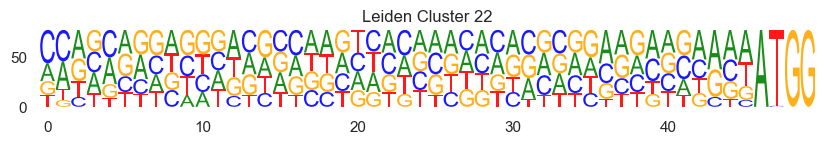

In [16]:
test_embedding_adata = ad.AnnData(test_repr, obs = test_df)
sc.pp.pca(test_embedding_adata, n_comps=50)
sc.pp.neighbors(test_embedding_adata)
sc.tl.umap(test_embedding_adata)
print(test_embedding_adata)

plot_anndata_rep(
    test_embedding_adata, color='class', direct_label=False, cmap=plt.get_cmap("tab20"),
    title="Unmod_1 test (n=20000, d=128): Last Layer Representation\nPCA->KNN->UMAP",
    legend_size=7,
).show()

sc.tl.leiden(test_embedding_adata, resolution=2.0)
plot_anndata_rep(
    test_embedding_adata, color='leiden', direct_label=True,
    title="Unmod_1 test (n=20000, d=128): Last Layer Representation\nPCA->KNN->UMAP->Leiden Clustering",
    legend_size=7,
).show()

metrics.silhouette_score(
    test_embedding_adata.X,
    test_embedding_adata.obs['leiden'],
)
metrics.silhouette_score(
    test_embedding_adata.X,
    test_embedding_adata.obs['class'],
)
test_input_fname, test_output_fname = logo_files(test_embedding_adata, 'test')
logo_graph(test_input_fname)

/home/ubuntu/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


AnnData object with n_obs × n_vars = 260000 × 128
    obs: 'sequences', 'labels', 'class', 'leiden'
    uns: 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'
nohup muscle -in /home/ubuntu/esm2/Sample/Embedding_Contacts/Train_msa_input_0.fa -out /home/ubuntu/esm2/Sample/Embedding_Contacts/msa_output_0.fa 2>&1 &
nohup muscle -in /home/ubuntu/esm2/Sample/Embedding_Contacts/Train_msa_input_1.fa -out /home/ubuntu/esm2/Sample/Embedding_Contacts/msa_output_1.fa 2>&1 &
nohup muscle -in /home/ubuntu/esm2/Sample/Embedding_Contacts/Train_msa_input_2.fa -out /home/ubuntu/esm2/Sample/Embedding_Contacts/msa_output_2.fa 2>&1 &
nohup muscle -in /home/ubuntu/esm2/Sample/Embedding_Contacts/Train_msa_input_3.fa -out /home/ubuntu/esm2/Sample/Embedding_Contacts/msa_output_3.fa 2>&1 &
nohup muscle -in /home/ubuntu/esm2/Sample/Embedding_Contacts/Train_msa_input_4.fa -out /home/ubuntu/esm2/Sample/Embedding_Contacts/msa_output_4.fa 2>&1 &


/tmp/ipykernel_92376/764380036.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 1))


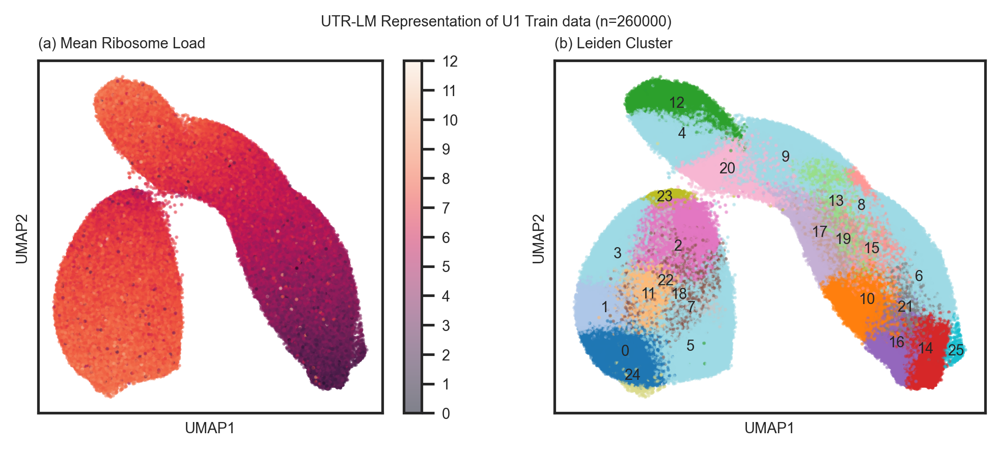

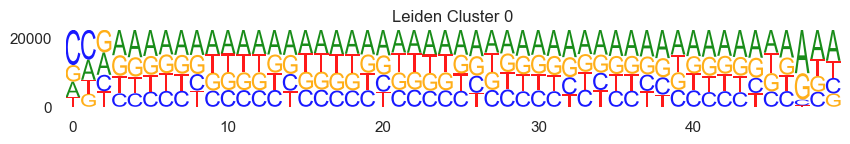

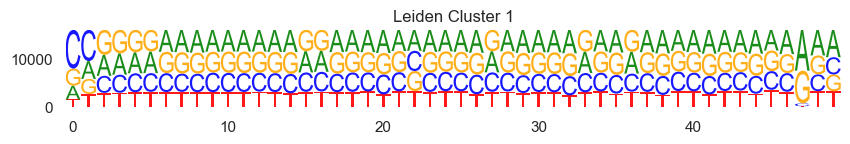

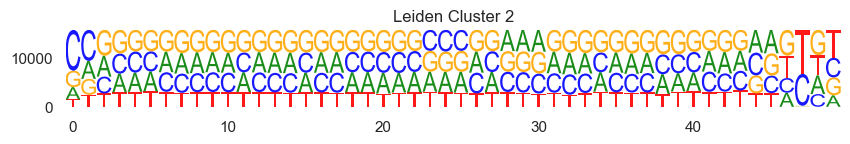

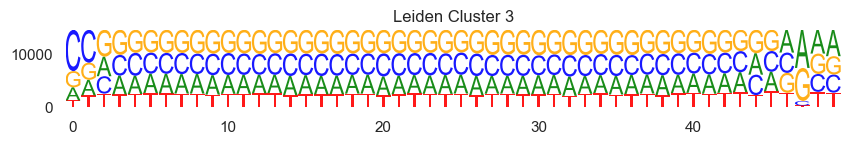

...

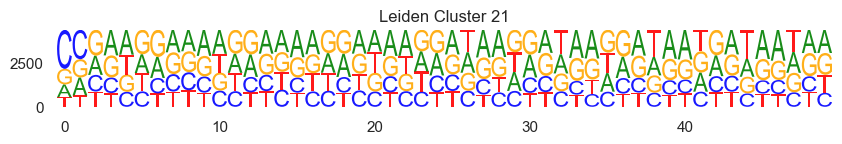

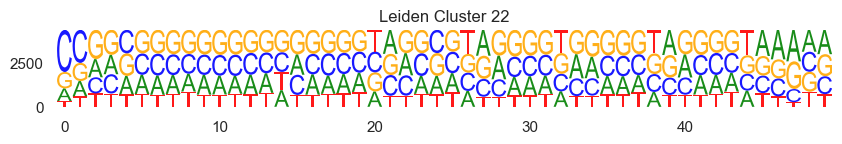

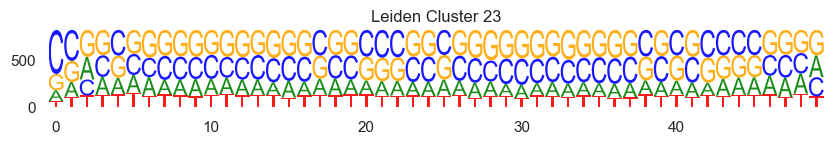

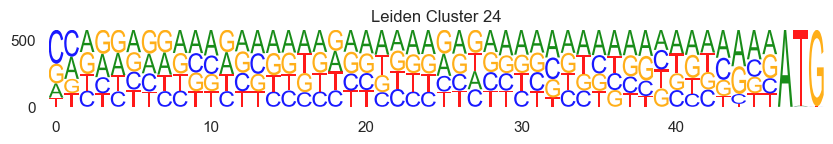

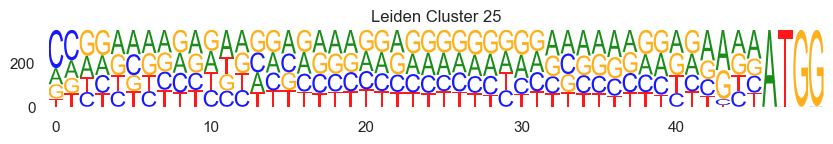

In [189]:
train_embedding_adata = ad.AnnData(train_repr, obs = train_df)
sc.pp.pca(train_embedding_adata, n_comps=50)
sc.pp.neighbors(train_embedding_adata)
sc.tl.umap(train_embedding_adata)
sc.tl.leiden(train_embedding_adata, resolution=2.0)
print(train_embedding_adata)

plot_anndata_rep(
    train_embedding_adata, label_color=train_embedding_adata.obs['labels'], leiden_color = 'leiden',
    title="UTR-LM Representation of U1 Train data (n=260000)",
    legend_size=7, figsize = (8, 3), fname = ''#f'UTRLM_{species}_SpeciesClass.pdf',
).show()

# plot_anndata_rep(
#     train_embedding_adata, color='class', direct_label=False, cmap=plt.get_cmap("tab20"),
#     title="Unmod_1 train (n=260000, d=128): Last Layer Representation\nPCA->KNN->UMAP",
#     legend_size=7,
#     fontsize = 7,
# ).show()

# sc.tl.leiden(train_embedding_adata, resolution=2.0)
# plot_anndata_rep(
#     train_embedding_adata, color='leiden', direct_label=True,
#     title="Unmod_1 train (n=260000, d=128): Last Layer Representation\nPCA->KNN->UMAP->Leiden Clustering",
#     legend_size=7,
#     fontsize = 7,
# ).show()

metrics.silhouette_score(
    train_embedding_adata.X,
    train_embedding_adata.obs['leiden'],
)
metrics.silhouette_score(
    train_embedding_adata.X,
    train_embedding_adata.obs['class'],
)
train_input_fname, train_output_fname = logo_files(train_embedding_adata, 'Train')
logo_graph(train_input_fname)

In [ ]:
all_embedding_adata = ad.AnnData(data_repr, obs = data_df)
sc.pp.pca(all_embedding_adata, n_comps=50)
sc.pp.neighbors(all_embedding_adata)
sc.tl.umap(all_embedding_adata)
sc.tl.leiden(all_embedding_adata, resolution=2.0)
print(all_embedding_adata)

plot_anndata_rep(
    all_embedding_adata, label_color=all_embedding_adata.obs['labels'], leiden_color = 'leiden',
    title="UTR-LM Representation of U1 library (n=280000)",
    legend_size=7, figsize = (8, 3), fname = ''#f'UTRLM_{species}_SpeciesClass.pdf',
).show()

/tmp/ipykernel_92376/1568685866.py:1: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  all_embedding_adata = ad.AnnData(data_repr, obs = data_df)
/home/ubuntu/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/ubuntu/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


/opt/conda/envs/pytorch/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


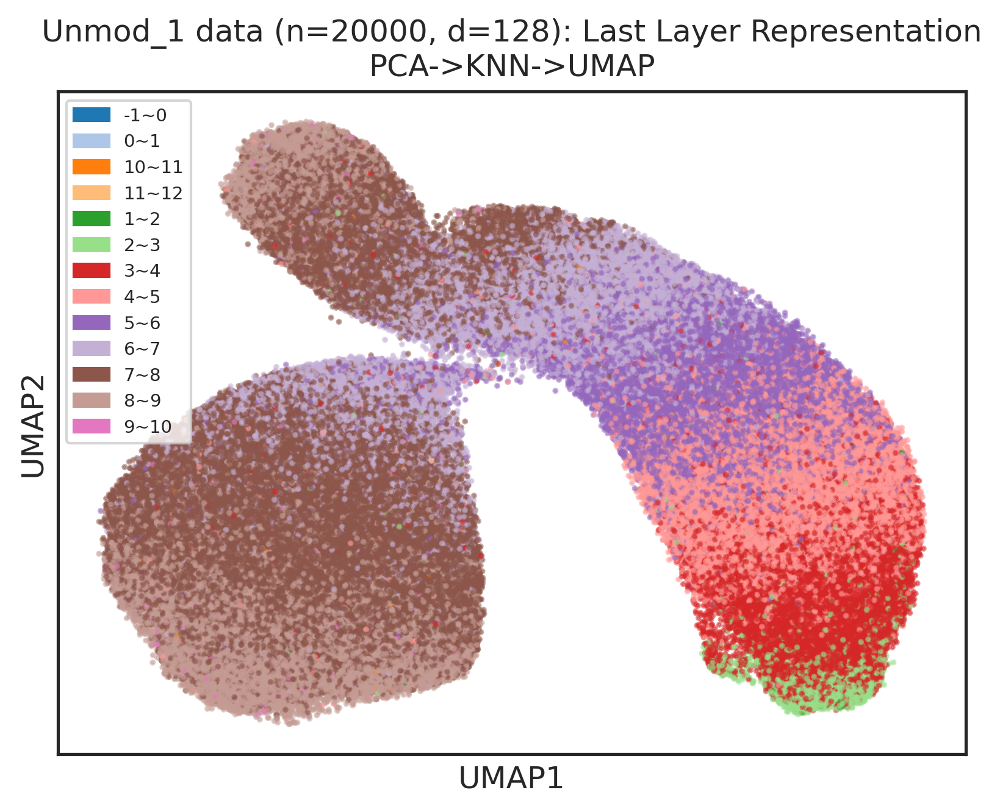

In [20]:
plot_anndata_rep(
    all_embedding_adata, color='class', direct_label=False, cmap=plt.get_cmap("tab20"),
    title="Unmod_1 data (n=20000, d=128): Last Layer Representation\nPCA->KNN->UMAP",
    legend_size=7,
).show()

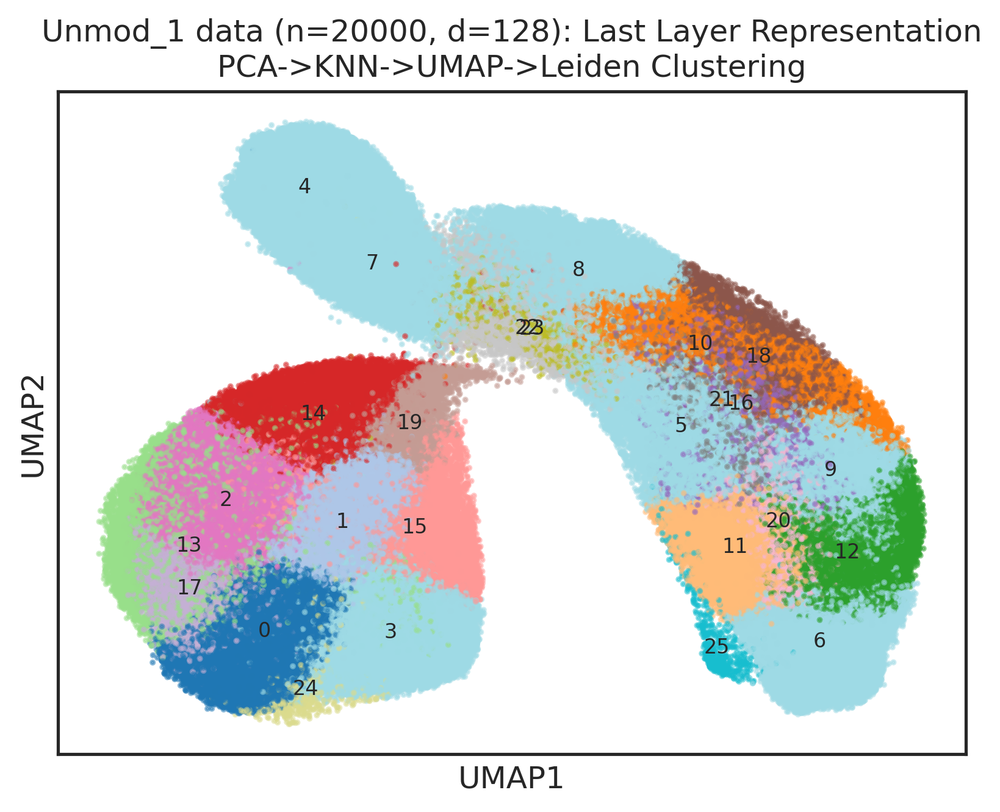

In [21]:
sc.tl.leiden(all_embedding_adata, resolution=2.0)
plot_anndata_rep(
    all_embedding_adata, color='leiden', direct_label=True,
    title="Unmod_1 data (n=20000, d=128): Last Layer Representation\nPCA->KNN->UMAP->Leiden Clustering",
    legend_size=8,
).show()

In [22]:
metrics.silhouette_score(
    all_embedding_adata.X,
    all_embedding_adata.obs['leiden'],
)

0.05965607

In [23]:
metrics.silhouette_score(
    all_embedding_adata.X,
    all_embedding_adata.obs['class'],
)

0.026068447

nohup muscle -in /home/ubuntu/esm2/Sample/Embedding_Contacts/All_msa_input_0.fa -out /home/ubuntu/esm2/Sample/Embedding_Contacts/msa_output_0.fa 2>&1 &
nohup muscle -in /home/ubuntu/esm2/Sample/Embedding_Contacts/All_msa_input_1.fa -out /home/ubuntu/esm2/Sample/Embedding_Contacts/msa_output_1.fa 2>&1 &
nohup muscle -in /home/ubuntu/esm2/Sample/Embedding_Contacts/All_msa_input_2.fa -out /home/ubuntu/esm2/Sample/Embedding_Contacts/msa_output_2.fa 2>&1 &
nohup muscle -in /home/ubuntu/esm2/Sample/Embedding_Contacts/All_msa_input_3.fa -out /home/ubuntu/esm2/Sample/Embedding_Contacts/msa_output_3.fa 2>&1 &
nohup muscle -in /home/ubuntu/esm2/Sample/Embedding_Contacts/All_msa_input_4.fa -out /home/ubuntu/esm2/Sample/Embedding_Contacts/msa_output_4.fa 2>&1 &
nohup muscle -in /home/ubuntu/esm2/Sample/Embedding_Contacts/All_msa_input_5.fa -out /home/ubuntu/esm2/Sample/Embedding_Contacts/msa_output_5.fa 2>&1 &
nohup muscle -in /home/ubuntu/esm2/Sample/Embedding_Contacts/All_msa_input_6.fa -out /ho

/tmp/ipykernel_1809010/764380036.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 1))


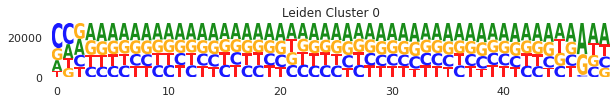

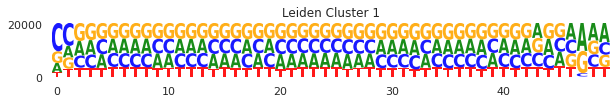

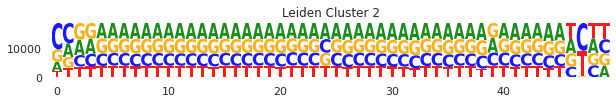

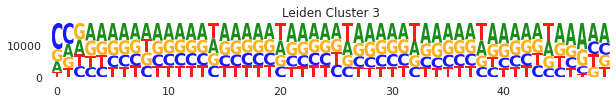

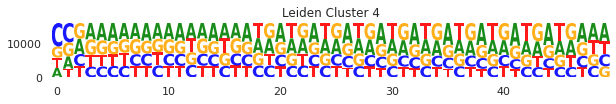

...

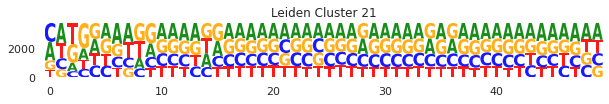

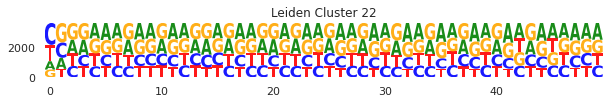

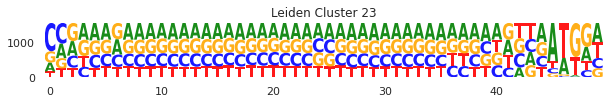

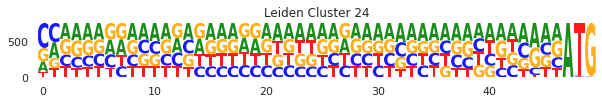

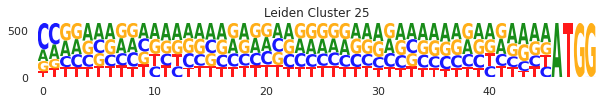

In [24]:
all_input_fname, all_output_fname = logo_files(all_embedding_adata, 'All')
logo_graph(all_input_fname)